# Generate npz files for all full correlations and their corresponding "stagger" output data.
## npz files can be read here as well for results plotting...

In [1]:
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import math
from astropy.io import fits
import time
from scipy.signal import correlate
import scipy as sp
import csv
import os
import pandas as pd
import glob
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

# main class where these functions are dumped:
from zonalwindfunctions import ZWP_Class


In [2]:
# longitutde array is defined relative to the West, which is how all maps are projected for this project.
long_res, lat_res = 360, 180
long_res_hi, lat_res_hi = 720, 360
long_array, lat_array = np.linspace(360, 0,long_res), np.linspace(-90, 90,lat_res)
long_array_hi, lat_array_hi = np.linspace(360, 0,long_res_hi), np.linspace(-90, 90,lat_res_hi)

one_J_day = 9.9258 # hours
variation = 51/60 # hrs
R_J = 71492e3 # m
R_J_p = 66854e3 # m

In [3]:
def generateArrays(output_file_list):

    # define relevant array lists...
    corr1D_list = []
    corr1D_err_list = []
    corr1D_fwhm_list = []
    corr_slide_list = []
    corr_slide_err_list = []
    corr_slide_fwhm_list = []
    lat_array_used = []
    long_array_use = []
    margin_applied_in_func_shifted = []
    date_list = []
    delta_t_list = []
    crit_lat_list = []
    pair_name_list = []
    lat_delta_indices_list           = []
    shifted_f1_list, shifted_f2_list = [], []
    std_stagger_list                 = []
    long_shift_applied_list          = []
    sigma_clip_list                  = []
    region_mean_list                 = []
    region_std_list                  = []
    regional_wind_err_bound_list     = []
    margin_app_list                  = []
    stagger_bool_list                = []

    # shifted_f1=[shifted_f1], shifted_f2=[shifted_f2], long_shift_applied=[long_shift_applied], 
    #                         final_longitudes_masked_shifted=[final_longitudes_masked_shifted], margin_applied_in_func_shifted=[margin_applied_in_func_shifted],
    #                         lat_array_used=[lat_array_use], long_array_use=[long_array_use],
    #                         date_list = date_meta_list[test_i], pair_names = pair_names, delta_t_arr = [delta_t], crit_lat=[critical_lat], lat_delta_indices=[lat_delta_indices],

    #                         corr_1D=[corr_1D], error_array_slide=[error_array_slide], corr_1D_slide_fwhm=[fwhm_array_slide], stagger_bool=[stagger_bool], corr_1D_coeff=[corr_1D_coeff],
    #                         corr_1D_noshift=[corr_1D_noshift], error_array=[error_array],  corr_1D_noshift_noslide_fwhm=[fwhm_array], corr_1D_coeff_noshift=[corr_1D_coeff_noshift],
    #                         std_stagger=[std_stagger], sigma_clip=[sigma_clip], region_mean=[region_mean], region_std=[region_std], regional_wind_err_bound=[regional_wind_err_bound], margin_app=[margin_app],
    #                         window_length=[window_length], window_stepping=[window_stepping], 
    #                         max_delta_longit=[max_delta_longit], lat_res_tol=[lat_res_tol], force_shift=force_shift

    for i_f, f in enumerate(output_file_list):
        npzfile = np.load(f)
        
        # Correlation with no sliding window
        corr1D_list.append(npzfile['corr_1D_noshift']) # smooth this with savgol jet_width=4, poly_order=3 - retains generality
        corr1D_err_list.append(npzfile['error_array']) # not smoothed - retains generality
        corr1D_fwhm_list.append(npzfile['corr_1D_noshift_noslide_fwhm'])

        # Correlation with 50˚ sliding window
        corr_slide_list.append(npzfile['corr_1D'])
        corr_slide_err_list.append(npzfile['error_array_slide'])
        corr_slide_fwhm_list.append(npzfile['corr_1D_slide_fwhm'])

        # Specific latitude array that was used - removes the need to interpolate later
        lat_array_used.append(npzfile['lat_array_used'])
        long_array_use.append(npzfile['long_array_use'])

        margin_applied_in_func_shifted.append(npzfile['margin_applied_in_func_shifted'])

        date_list.append(npzfile['date_list'])
        delta_t_list.append(npzfile['delta_t_arr'])
        crit_lat_list.append(npzfile['crit_lat'])
        pair_name_list.append(npzfile['pair_names'])
        lat_delta_indices_list.append(npzfile['lat_delta_indices'])
        shifted_f1_list.append(npzfile['shifted_f1'])
        shifted_f2_list.append(npzfile['shifted_f1'])
        shifted_f2_list.append(npzfile['shifted_f1'])

        long_shift_applied_list.append(npzfile['long_shift_applied'])
        std_stagger_list.append(npzfile['std_stagger'])
        stagger_bool_list.append(npzfile['stagger_bool'])
        sigma_clip_list.append(npzfile['sigma_clip'])
        region_mean_list.append(npzfile['region_mean'])
        region_std_list.append(npzfile['region_std'])
        regional_wind_err_bound_list.append(npzfile['regional_wind_err_bound'])
        margin_app_list.append(npzfile['margin_app'])

        print(npzfile['pair_names'], npzfile['date_list'], npzfile['delta_t_arr'], 'shape: ', len(npzfile['corr_1D_noshift'][0]), i_f)
    
    return {
        "corr1D_list": corr1D_list,
        "corr1D_err_list": corr1D_err_list,
        "corr1D_fwhm_list": corr1D_fwhm_list,
        "corr_slide_list": corr_slide_list,
        "corr_slide_err_list": corr_slide_err_list,
        "corr_slide_fwhm_list": corr_slide_fwhm_list,
        "lat_array_used": lat_array_used,
        "long_array_use": long_array_use,
        "margin_applied_in_func_shifted": margin_applied_in_func_shifted,
        "date_list": date_list,
        "delta_t_list": delta_t_list,
        "crit_lat_list": crit_lat_list,
        "pair_name_list": pair_name_list,
        "lat_delta_indices_list" : lat_delta_indices_list          ,
        "shifted_f1_list" : shifted_f1_list,
        "shifted_f2_list" : shifted_f2_list,
        "std_stagger_list" : std_stagger_list                ,
        "stagger_bool_list" : stagger_bool_list                ,
        "long_shift_applied_list" : long_shift_applied_list         ,
        "sigma_clip_list" : sigma_clip_list                 ,
        "region_mean_list" : region_mean_list                ,
        "region_std_list" : region_std_list                 ,
        "regional_wind_err_bound_list" : regional_wind_err_bound_list    ,
        "margin_app_list" : margin_app_list                 ,

    }

In [4]:
def run_stagger_pipeline(year_str='2016', test_i=0, long_shift_applied=120, margin_app=5, force_shift=False, save_bool=False, mapping=True):
    '''
    Load data from file to get the correct file list
    '''

    # Update if need be but try to keep things where they are. execution_path is the directory in which /prvt/ exists.
    execution_path = '/Users/ahyder/Desktop/windfieldproject'

    # Load from a CSV file
    year = year_str
    main_path = 'spex/post_invigilation/'
    cmap_files_paths_list_51 = [] # with threshold set to 51 min (0.85)
    t_diff_list_cmap_51 = []

    with open(main_path+f"PI_{year}.csv", "r") as f:
        reader = csv.reader(f)
        counter = 0
        for row in reader:
            selected_pair, t_diff_of_pair = [row[0], row[1]], float(row[2])
            t_diff_list_cmap_51.append(t_diff_of_pair)
            cmap_files_paths_list_51.append([selected_pair[0], selected_pair[1]])
            if test_i==0:
                print(counter, selected_pair, t_diff_of_pair)
            counter += 1

    '''
    Super important index list! It is necessary for compatiblity of the maps.
    0 - pair is already compatible.
    1 - first map has a higher resolution and needs to be unresolved.
    2 - second map has a higher resolution and needs to be unresolved.
    '''

    date_meta_list = []
    smart_index_list = np.zeros(len(cmap_files_paths_list_51))
    for i_f, f in enumerate(cmap_files_paths_list_51):
        hdul0 = fits.open(execution_path+f[0])
        hdul1 = fits.open(execution_path+f[1])
        d_t_0 = str(hdul0[0].header['DATE_OBS'] + 'T' + hdul0[0].header['TIME_OBS'])
        d_t_1 = str(hdul1[0].header['DATE_OBS'] + 'T' + hdul1[0].header['TIME_OBS'])
        date_meta_list.append([d_t_0, d_t_1])
        # print(f[0].split('spex/')[-1], f[1].split('spex/')[-1])
        smart_index_list[i_f] = ZWP_Class.checkMapResolution(hdul0[0].data, hdul1[0].data)
        hdul0.close()
        hdul1.close()

    compatible_map_pairs = ZWP_Class.makeMapsCompatible(cmap_files_paths_list_51, smart_index_list, emission_angle_correction=True, execution_path_bool=True, fits_str='.mu.gz') # defaults to fits_str='.mu.fits.gz'

    if test_i==0:
        print(smart_index_list)
        for i in range(len(compatible_map_pairs)):
            print(i, compatible_map_pairs[i][0].shape, compatible_map_pairs[i][1].shape, int(smart_index_list[i]), date_meta_list[i])

        print()
        print(f'Total of {len(smart_index_list)} pairs to work through...')

    '''
    Setup parameters to specific year here and then immediately save it in npz file
    '''

    test_i             = test_i               # index of the pair being correlated.
    long_shift_applied = long_shift_applied   # what is the shift that you want to apply, if need be.
    margin_app         = margin_app           # how far you want to be from the NaNs. Sometimes needs to be lowered to 3 in the event that margin application fails.
    window_length      = 45                   # width of the sliding window.
    window_stepping    = 1                    # how many longitudes does the sliding take.
    critical_lat       = 55                   # the latitude where the correlation function stops applying.
    std_stagger        = 1.15                 # sigma threshold that defines how large the max peak can be beyond the median of a specific latitude.

    # Rarely changed variables:
    max_delta_longit   = 10   # how many ∆longitudes are permitted.
    lat_res_tol        = 1e-2 # margin calculation threshold using critical latitude.
    force_shift        = force_shift

    print('map shape: ', compatible_map_pairs[test_i][0].shape)
    print()

    if compatible_map_pairs[test_i][0].size > 180*360:
        lat_array_use  = lat_array_hi
        long_array_use = long_array_hi
    else:
        lat_array_use  = lat_array
        long_array_use = long_array

    # with slides and staggering:
    _, _, _, _, _, corr_1D, corr_1D_coeff, error_array_slide, fwhm_array_slide, stagger_bool = ZWP_Class.getFullLatitudinalCorrelation(
                                compatible_map_pairs[test_i][0], compatible_map_pairs[test_i][1], 
                                long_array_use, lat_array_use, shift_long=long_shift_applied, crit_lat=critical_lat, 
                                margin=margin_app, max_delta_long=max_delta_longit, force_shift=force_shift, sliding_window_boolean=True, sliding_window_len=window_length, window_step=window_stepping, stagger=True, std_stagger=std_stagger, lat_res_tol=lat_res_tol)
    print()
    # no slides - full image correlations:
    shifted_f1, shifted_f2, shifted_BIM, margin_applied_in_func_shifted, final_longitudes_masked_shifted, corr_1D_noshift, corr_1D_coeff_noshift, error_array, fwhm_array = ZWP_Class.getFullLatitudinalCorrelation(
                                compatible_map_pairs[test_i][0], compatible_map_pairs[test_i][1], 
                                long_array_use, lat_array_use, shift_long=long_shift_applied, crit_lat=critical_lat, 
                                margin=margin_app, max_delta_long=max_delta_longit, force_shift=force_shift, sliding_window_boolean=False, sliding_window_len=window_length, window_step=window_stepping, lat_res_tol=lat_res_tol)


    lat_delta_indices = [np.where(np.isclose(lat_array_use, -critical_lat, lat_res_tol))[0][0], np.where(np.isclose(lat_array_use, critical_lat, lat_res_tol))[0][0]+1]
    output_path = '/Users/ahyder/Desktop/windfieldproject/spex/outputs/outputs_with_stagger/' + year + '/'
    zwp_output_str = cmap_files_paths_list_51[test_i][0].split('/')[4] + '_' + cmap_files_paths_list_51[test_i][0].split('/')[-1].split('.cmap')[0] + '_' + cmap_files_paths_list_51[test_i][1].split('/')[-1].split('.cmap')[0]
    pair_names = [cmap_files_paths_list_51[test_i][0].split('/')[-1], cmap_files_paths_list_51[test_i][1].split('/')[-1]]
    delta_t = t_diff_list_cmap_51[test_i]*3600

    print(cmap_files_paths_list_51[test_i])
    print(output_path, zwp_output_str)
    print(pair_names)
    print(date_meta_list[test_i])

    sigma_clip = 3
    arcsec_jup = 30 # minimum apparent angular diameter for Jupiter
    region_mean, region_std = ZWP_Class.getSubPixErr(error_array, long_array_use, lat_array_use, NS_bounding_lat=20.0, sigma_clip=sigma_clip)
    regional_wind_err_bound = ZWP_Class.getWindErratSubPix(subpix_std=region_std, arcsec_jup=arcsec_jup, delta_t=delta_t, arcsec_per_pix_spex=0.12)

    print(f'Actual wind error in the ±20˚ region post sigma clipping ({sigma_clip}σ) at {arcsec_jup}": ±', round(regional_wind_err_bound, 2), ' m/s')

    # '''Save as .npz - includes as much info as possible'''
    if save_bool:
        np.savez_compressed(output_path + zwp_output_str,
                            shifted_f1=[shifted_f1], shifted_f2=[shifted_f2], long_shift_applied=[long_shift_applied], 
                            final_longitudes_masked_shifted=[final_longitudes_masked_shifted], margin_applied_in_func_shifted=[margin_applied_in_func_shifted],
                            lat_array_used=[lat_array_use], long_array_use=[long_array_use],
                            date_list = date_meta_list[test_i], pair_names = pair_names, delta_t_arr = [delta_t], crit_lat=[critical_lat], lat_delta_indices=[lat_delta_indices],

                            corr_1D=[corr_1D], error_array_slide=[error_array_slide], corr_1D_slide_fwhm=[fwhm_array_slide], stagger_bool=[stagger_bool], corr_1D_coeff=[corr_1D_coeff],
                            corr_1D_noshift=[corr_1D_noshift], error_array=[error_array],  corr_1D_noshift_noslide_fwhm=[fwhm_array], corr_1D_coeff_noshift=[corr_1D_coeff_noshift],
                            std_stagger=[std_stagger], sigma_clip=[sigma_clip], region_mean=[region_mean], region_std=[region_std], regional_wind_err_bound=[regional_wind_err_bound], margin_app=[margin_app],
                            window_length=[window_length], window_stepping=[window_stepping], 
                            max_delta_longit=[max_delta_longit], lat_res_tol=[lat_res_tol], force_shift=force_shift
                            )
        if mapping:
            return compatible_map_pairs
    else:
        if mapping:
            return compatible_map_pairs


In [5]:
long_shift_arr = np.array([
90,
270,
270,
90,
120,
120,
90,
90,
90,
90,
90,
90,
90,
90,
90,
90,
90,
])

margin_app_arr = np.array([
5,
5,
4,
5,
5,
5,
5,
5,
5,
5,
5,
5,
3,
5,
3,
3,
5
])

'''
For 2023, test_i=1,2 need force_shift=True, so be mindful if regenerating outputs again
'''

# for i in np.arange(20):
#     run_stagger_pipeline(year_str='2024', test_i=i, long_shift_applied=90, margin_app=5, force_shift=False, save_bool=False)

'\nFor 2023, test_i=1,2 need force_shift=True, so be mindful if regenerating outputs again\n'

In [6]:
# sample run with default parameters for stagger pipeline:
run_stagger_pipeline()

0 ['/prvt/cirs12/spex/2016may11/images/5.10/jupiter/jcf0057500592.cmap.gz', '/prvt/cirs12/spex/2016may12/images/5.10/jupiter/jcf0000100008.cmap.gz'] 20.356535916944445
1 ['/prvt/cirs12/spex/2016may11/images/5.10/jupiter/jcf0057500592.cmap.gz', '/prvt/cirs12/spex/2016may12/images/5.10/jupiter/jcf0009900116.cmap.gz'] 20.734795466666668
2 ['/prvt/cirs12/spex/2016may11/images/5.10/jupiter/jcf0057500592.cmap.gz', '/prvt/cirs12/spex/2016may12/images/5.10/jupiter/jcf0003100048.cmap.gz'] 20.51384277527778
3 ['/prvt/cirs12/spex/2016may11/images/5.10/jupiter/jcf0072300740.cmap.gz', '/prvt/cirs12/spex/2016may12/images/5.10/jupiter/jcf0000100008.cmap.gz'] 19.2100184475
4 ['/prvt/cirs12/spex/2016may11/images/5.10/jupiter/jcf0072300740.cmap.gz', '/prvt/cirs12/spex/2016may12/images/5.10/jupiter/jcf0009900116.cmap.gz'] 19.58827799722222
5 ['/prvt/cirs12/spex/2016may11/images/5.10/jupiter/jcf0072300740.cmap.gz', '/prvt/cirs12/spex/2016may12/images/5.10/jupiter/jcf0017700194.cmap.gz'] 20.66119737527778


[[array([[1220.7311, 1219.3228, 1218.0524, ..., 1224.8379, 1223.4906,
          1222.0453],
         [1097.8306, 1093.1132, 1088.4495, ..., 1111.9441, 1107.261 ,
          1102.55  ],
         [1037.8049, 1032.7329, 1027.6138, ..., 1053.0153, 1047.9702,
          1042.9218],
         ...,
         [      nan,       nan,       nan, ...,       nan,       nan,
                nan],
         [      nan,       nan,       nan, ...,       nan,       nan,
                nan],
         [      nan,       nan,       nan, ...,       nan,       nan,
                nan]], shape=(360, 720), dtype=float32),
  array([[5902.697 , 5904.1895, 5906.4707, ..., 5896.9395, 5898.65  ,
          5900.353 ],
         [4872.183 , 4873.5083, 4874.7056, ..., 4868.695 , 4869.8257,
          4871.0146],
         [4164.755 , 4167.739 , 4170.7188, ..., 4155.07  , 4158.3667,
          4161.503 ],
         ...,
         [      nan,       nan,       nan, ...,       nan,       nan,
                nan],
         [      n

In [7]:
year_arr = np.array([2016, 2017, 2018, 2019, 2020, 2021, 2022, 2023, 2024])

# print(np.load(output_file_list[0]))

IR_dataframe = []
for i, iy in enumerate(year_arr):
    output_path = '/Users/ahyder/Desktop/windfieldproject/spex/outputs/outputs_with_stagger/' + str(year_arr[i]) + '/'
    output_file_list = glob.glob(output_path + '*.npz')
    IR_dataframe.append(generateArrays(output_file_list=output_file_list))

['jcf0057500592.cmap.gz' 'jcf0003100048.cmap.gz'] ['2016-05-11T08:47:33.92773' '2016-05-12T05:18:23.76172'] [73849.833991] shape:  360 0
['jcf0053300544.cmap.gz' 'jcf0003100048.cmap.gz'] ['2016-05-11T08:39:34.17773' '2016-05-12T05:18:23.76172'] [74329.583991] shape:  360 1
['jcf0072300740.cmap.gz' 'jcf0000100008.cmap.gz'] ['2016-05-11T09:56:21.39062' '2016-05-12T05:08:57.45703'] [69156.066411] shape:  360 2
['jcf0022700356.cmap.gz' 'jcf0003700060.cmap.gz'] ['2016-11-01T20:53:38.92188' '2016-11-02T17:10:07.61719'] [72988.695309] shape:  360 3
['jcf0057500592.cmap.gz' 'jcf0000100008.cmap.gz'] ['2016-05-11T08:47:33.92773' '2016-05-12T05:08:57.45703'] [73283.529301] shape:  360 4
['jcf0072300740.cmap.gz' 'jcf0003100048.cmap.gz'] ['2016-05-11T09:56:21.39062' '2016-05-12T05:18:23.76172'] [69722.371101] shape:  360 5
['jcf0053300544.cmap.gz' 'jcf0000100008.cmap.gz'] ['2016-05-11T08:39:34.17773' '2016-05-12T05:08:57.45703'] [73763.279301] shape:  360 6
['jcf0072300740.cmap.gz' 'jcf0017700194.c

dict_keys(['corr1D_list', 'corr1D_err_list', 'corr1D_fwhm_list', 'corr_slide_list', 'corr_slide_err_list', 'corr_slide_fwhm_list', 'lat_array_used', 'long_array_use', 'margin_applied_in_func_shifted', 'date_list', 'delta_t_list', 'crit_lat_list', 'pair_name_list', 'lat_delta_indices_list', 'shifted_f1_list', 'shifted_f2_list', 'std_stagger_list', 'stagger_bool_list', 'long_shift_applied_list', 'sigma_clip_list', 'region_mean_list', 'region_std_list', 'regional_wind_err_bound_list', 'margin_app_list'])

For  2016 , there were  11  1D IR wind profiles (# of pairs)
['2016-05-11T08:47:33.92773' '2016-05-12T05:18:23.76172']  has a regional wind error bound of:  6.18279398811678  with regional mean, std of:  -0.0125 0.7983381175917883
['2016-05-11T08:39:34.17773' '2016-05-12T05:18:23.76172']  has a regional wind error bound of:  6.200597116377167  with regional mean, std of:  -0.275 0.8058380730643098
['2016-05-11T09:56:21.39062' '2016-05-12T05:08:57.45703']  has a regional wind error bound 

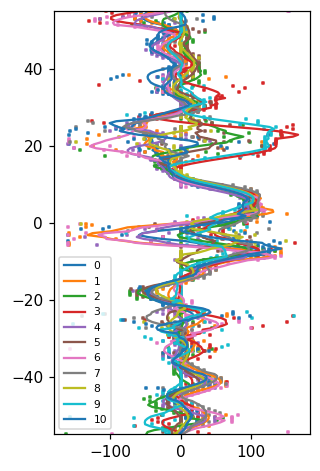

For  2017 , there were  11  1D IR wind profiles (# of pairs)
['2017-07-10T06:08:46.47852' '2017-07-11T02:04:58.0415']  has a regional wind error bound of:  42.81350766518605  with regional mean, std of:  0.6 5.372615750265414
['2017-05-19T08:47:58.86133' '2017-05-20T05:32:27.14453']  has a regional wind error bound of:  5.247727133110078  with regional mean, std of:  0.175 0.6851094803022361
['2017-07-10T06:08:46.47852' '2017-07-11T02:42:58.85645']  has a regional wind error bound of:  69.09035915503719  with regional mean, std of:  1.5375 8.945590743489218
['2017-07-10T06:08:46.47852' '2017-07-11T02:36:27.96582']  has a regional wind error bound of:  86.42994487532633  with regional mean, std of:  -1.3875 11.131592148026265
['2017-07-10T06:08:46.47852' '2017-07-11T01:12:26.20752']  has a regional wind error bound of:  117.9397757203376  with regional mean, std of:  1.85 14.15017667734223
['2017-05-19T08:47:58.86133' '2017-05-20T05:07:17.11914']  has a regional wind error bound of:  5.

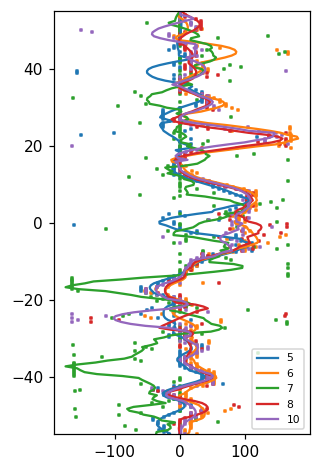

For  2018 , there were  6  1D IR wind profiles (# of pairs)
['2018-07-20T09:08:39.59375' '2018-07-21T04:19:20.52441']  has a regional wind error bound of:  6.3326664073887615  with regional mean, std of:  0.125 0.7644442425710327
['2018-07-20T09:16:21.94141' '2018-07-21T04:28:23.19922']  has a regional wind error bound of:  10.091168956687204  with regional mean, std of:  0.0125 1.2195670338279894
['2018-07-20T09:08:39.59375' '2018-07-21T04:52:48.20312']  has a regional wind error bound of:  6.090873744586368  with regional mean, std of:  0.05 0.7566372975210778
['2018-07-20T09:16:21.94141' '2018-07-21T04:19:20.52441']  has a regional wind error bound of:  7.08888371180094  with regional mean, std of:  -0.05 0.85
['2018-07-20T09:16:21.94141' '2018-07-21T04:52:48.20312']  has a regional wind error bound of:  6.588078682088404  with regional mean, std of:  -0.0375 0.8130767183974708
['2018-07-20T09:08:39.59375' '2018-07-21T04:28:23.19922']  has a regional wind error bound of:  6.33264533

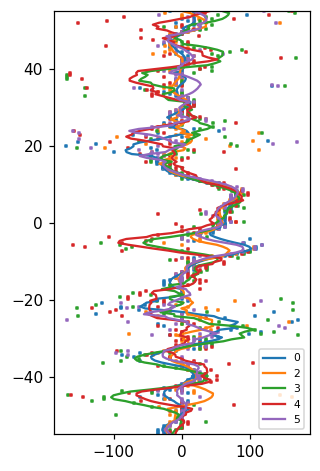

For  2019 , there were  17  1D IR wind profiles (# of pairs)
['2019-01-16T20:44:11.49219' '2019-01-17T17:00:46.75391']  has a regional wind error bound of:  5.60148334118485  with regional mean, std of:  -0.1625 0.7149082108914402
['2019-01-16T20:56:58.03906' '2019-01-17T17:00:46.75391']  has a regional wind error bound of:  5.384185841420532  with regional mean, std of:  -0.0125 0.6799586384479573
['2019-01-16T22:10:21.44531' '2019-01-17T18:42:09.32031']  has a regional wind error bound of:  4.923800380621981  with regional mean, std of:  -0.0875 0.6362733296312206
['2019-01-16T21:58:21.21875' '2019-01-17T18:00:25.48438']  has a regional wind error bound of:  1.2380504480749701  with regional mean, std of:  -0.025 0.15612494995995996
['2019-01-16T21:58:21.21875' '2019-01-17T16:50:59.84766']  has a regional wind error bound of:  6.0239803535341885  with regional mean, std of:  0.0125 0.7157819151110204
['2019-01-16T22:10:21.44531' '2019-01-17T18:53:07.53125']  has a regional wind error

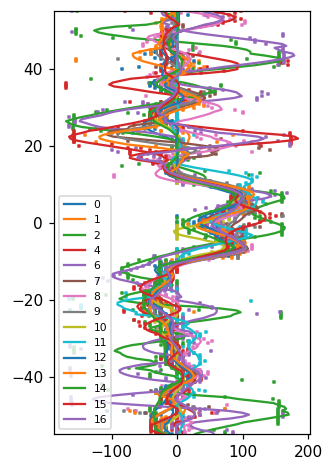

For  2020 , there were  12  1D IR wind profiles (# of pairs)
['2020-12-23T03:14:53.31738' '2020-12-23T23:31:09.75']  has a regional wind error bound of:  4.569874387113116  with regional mean, std of:  -0.1 0.5830951894845301
['2020-11-07T04:34:30.99805' '2020-11-08T00:55:56.8418']  has a regional wind error bound of:  6.99048934918848  with regional mean, std of:  0.1875 0.8957364288673315
['2020-11-07T05:05:15.68164' '2020-11-08T00:55:56.8418']  has a regional wind error bound of:  49.52612758682838  with regional mean, std of:  2.4375 6.186363531995189
['2020-12-23T03:35:57.00391' '2020-12-23T23:21:49.35938']  has a regional wind error bound of:  5.205463680067803  with regional mean, std of:  -0.075 0.6475916923494309
['2020-11-10T04:38:25.33203' '2020-11-11T00:31:54.51526']  has a regional wind error bound of:  4.072540270651267  with regional mean, std of:  -0.2 0.5099019513592785
['2020-07-04T12:35:00.21484' '2020-07-05T09:15:51.39062']  has a regional wind error bound of:  3.71

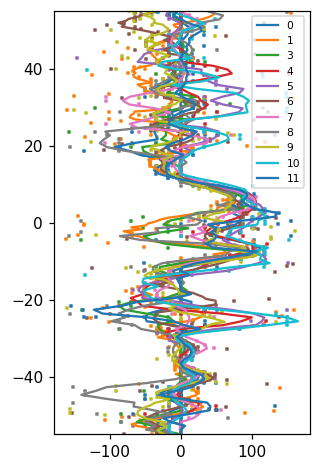

For  2021 , there were  16  1D IR wind profiles (# of pairs)
['2021-07-21T13:24:14.77734' '2021-07-22T09:47:48.29688']  has a regional wind error bound of:  32.39432127924427  with regional mean, std of:  4.4 4.158124577258358
['2021-07-21T15:20:34.04688' '2021-07-22T11:45:25.44531']  has a regional wind error bound of:  0.0  with regional mean, std of:  0.0 0.0
['2021-07-21T13:56:38.52734' '2021-07-22T09:47:48.29688']  has a regional wind error bound of:  3.4882038129108524  with regional mean, std of:  0.1 0.4358898943540674
['2021-07-21T15:20:34.04688' '2021-07-22T10:40:13.07812']  has a regional wind error bound of:  0.0  with regional mean, std of:  0.0 0.0
['2021-07-21T13:56:38.52734' '2021-07-22T10:40:13.07812']  has a regional wind error bound of:  3.9783459763502513  with regional mean, std of:  -0.075 0.5190134873006674
['2021-06-07T11:50:44.6875' '2021-06-08T17:21:07.02734']  has a regional wind error bound of:  3.381319882931362  with regional mean, std of:  0.075 0.6279928

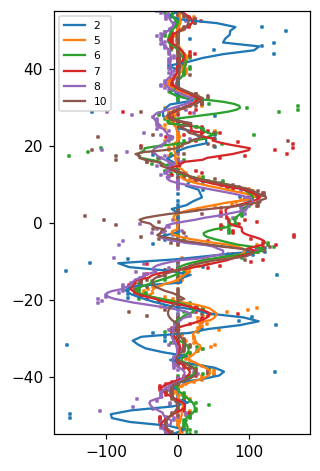

For  2022 , there were  13  1D IR wind profiles (# of pairs)
['2022-08-17T16:07:14.17969' '2022-08-18T12:39:31.58594']  has a regional wind error bound of:  5.733471639114033  with regional mean, std of:  -0.025 0.7411983540186797
['2022-04-08T17:42:41.700440' '2022-04-09T23:21:04.02344']  has a regional wind error bound of:  4.18637835905523  with regional mean, std of:  -0.2 0.7810249675906654
['2022-04-08T21:08:07.24219' '2022-04-09T16:52:32.15625']  has a regional wind error bound of:  6.611405786206508  with regional mean, std of:  -0.1125 0.8214887400323877
['2022-05-21T20:14:36.03125' '2022-05-22T16:40:38.32422']  has a regional wind error bound of:  5.686814561207106  with regional mean, std of:  -0.2 0.7314369419163897
['2022-07-08T17:38:07.36328' '2022-07-09T12:33:54.12891']  has a regional wind error bound of:  6.192289777464017  with regional mean, std of:  0.175 0.7378177281686853
['2022-08-17T16:07:14.17969' '2022-08-18T11:18:53.78125']  has a regional wind error bound of

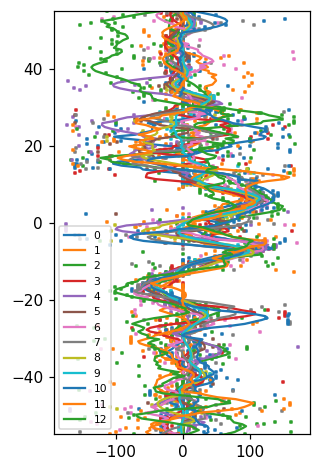

For  2023 , there were  17  1D IR wind profiles (# of pairs)
['2023-10-14T14:53:00.65625' '2023-10-15T10:41:36.07422']  has a regional wind error bound of:  6.269283694824091  with regional mean, std of:  -0.0375 0.7817248556877285
['2023-05-16T17:00:52.21094' '2023-05-17T22:53:42.29688']  has a regional wind error bound of:  3.29299961040171  with regional mean, std of:  -0.0625 0.6193494570918747
['2023-05-16T17:00:52.21094' '2023-05-17T22:06:58.75']  has a regional wind error bound of:  4.565411077934632  with regional mean, std of:  -0.275 0.8362864341838865
['2023-06-23T15:58:38.880361' '2023-06-24T21:00:39.964683']  has a regional wind error bound of:  3.8199812175620402  with regional mean, std of:  0.0125 0.6981001002721602
['2023-06-23T16:07:05.96875' '2023-06-24T21:00:39.964683']  has a regional wind error bound of:  4.187078881569326  with regional mean, std of:  0.0875 0.7614747205259016
['2023-11-23T09:31:30.41797' '2023-11-24T05:31:46.97266']  has a regional wind error bo

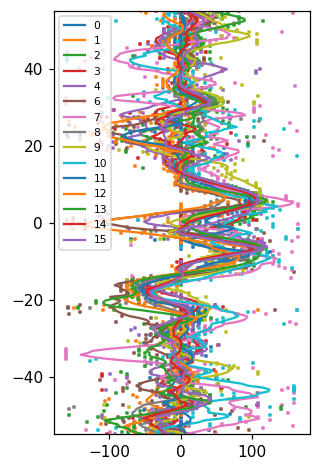

For  2024 , there were  20  1D IR wind profiles (# of pairs)
['2024-11-23T09:30:52.83594' '2024-11-24T15:04:35.8125']  has a regional wind error bound of:  3.6449447352581488  with regional mean, std of:  -0.3 0.6782329983125268
['2024-11-23T09:30:10.76953' '2024-11-24T15:04:35.8125']  has a regional wind error bound of:  3.563417743819259  with regional mean, std of:  -0.1 0.66332495807108
['2024-08-16T19:50:08.63281' '2024-08-17T14:45:15.22656']  has a regional wind error bound of:  4.782797141907917  with regional mean, std of:  -0.225 0.5695392874947259
['2024-11-23T09:29:27.96875' '2024-11-24T15:07:04.96875']  has a regional wind error bound of:  4.936599822251535  with regional mean, std of:  -0.45 0.9205976319760986
['2024-11-23T09:31:41.05469' '2024-11-24T15:04:35.8125']  has a regional wind error bound of:  4.53041538790545  with regional mean, std of:  -0.2 0.8426149773176359
['2024-10-22T14:01:56.875' '2024-10-23T10:33:15.97266']  has a regional wind error bound of:  5.25054

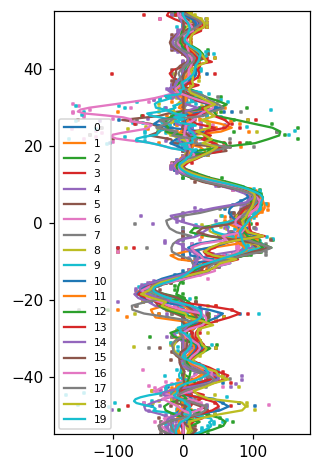

In [8]:
print(IR_dataframe[1].keys())
print()
%matplotlib inline

skip = [(5, 4), (1, 1)]
for i, iy in enumerate(year_arr):
    plt.figure(figsize=(3,5), dpi=110)
    print('For ', iy, ', there were ', len(IR_dataframe[i]["corr1D_list"]), ' 1D IR wind profiles (# of pairs)')
    for j in range(len(IR_dataframe[i]["corr1D_list"])):
        print(IR_dataframe[i]["date_list"][j], ' has a regional wind error bound of: ', IR_dataframe[i]["regional_wind_err_bound_list"][j][0],
              ' with regional mean, std of: ',  IR_dataframe[i]["region_mean_list"][j][0], IR_dataframe[i]["region_std_list"][j][0])
        if 2.0 < IR_dataframe[i]["regional_wind_err_bound_list"][j][0] <= 10.0:
            if (i, j) not in skip:
                vel = -ZWP_Class.getSpeedatLat(IR_dataframe[i]["corr1D_list"][j][0], IR_dataframe[i]["lat_array_used"][j][0], 
                                                IR_dataframe[i]["delta_t_list"][j][0])
                smooth_vel = ZWP_Class.getSmoothedProfile(vel, IR_dataframe[i]["lat_array_used"][j][0], jet_width=7, poly_order=3)
                plt.scatter(vel, IR_dataframe[i]["lat_array_used"][j][0],
                                                marker='s', s=1)
                plt.plot(smooth_vel, IR_dataframe[i]["lat_array_used"][j][0], label=str(j))
        
    print()

    plt.ylim(-55, 55)
    plt.legend(fontsize=7)
    plt.show()


In [9]:
print(IR_dataframe[1].keys())
print()

opal_path = '/Users/ahyder/Desktop/windfieldproject/OPAL/HST_Mosaics/'
mosaic_array = glob.glob(opal_path + '*.fits')

dict_keys(['corr1D_list', 'corr1D_err_list', 'corr1D_fwhm_list', 'corr_slide_list', 'corr_slide_err_list', 'corr_slide_fwhm_list', 'lat_array_used', 'long_array_use', 'margin_applied_in_func_shifted', 'date_list', 'delta_t_list', 'crit_lat_list', 'pair_name_list', 'lat_delta_indices_list', 'shifted_f1_list', 'shifted_f2_list', 'std_stagger_list', 'stagger_bool_list', 'long_shift_applied_list', 'sigma_clip_list', 'region_mean_list', 'region_std_list', 'regional_wind_err_bound_list', 'margin_app_list'])



In [10]:
print(IR_dataframe[2]['stagger_bool_list'][3].shape)

(1, 2, 221, 88)


In [48]:
'''
Load HST datasets
'''

HST_homo_dataframe_mainfile = np.load('OPAL/HST_homo_dataframe.npz')
HST_homo_dataframe = HST_homo_dataframe_mainfile['HST_homo_dataframe'][0, ...]
HST_interp_lat_array = HST_homo_dataframe_mainfile['HST_interp_lat_array'][0, ...]
HST_interp_lat_array_cent = HST_homo_dataframe_mainfile['HST_interp_lat_array_cent'][0, ...]

opal_2015        = pd.read_excel('OPAL/Simon+2015_ZWP_HST.xlsx') # with only LAT and FMZW
opal_2016        = pd.read_excel('OPAL/ZWP_j2016.xlsx')
opal_2017        = pd.read_excel('OPAL/2017_631.xlsx')
opal_2018        = pd.read_excel('OPAL/2018_631.xlsx')
opal_2019        = pd.read_excel('OPAL/2019_631.xlsx')
opal_2020        = pd.read_excel('OPAL/2020_631.xlsx')
opal_2021        = pd.read_excel('OPAL/2021_631.xlsx')
opal_2022        = pd.read_excel('OPAL/2022_631.xlsx')
opal_2024b       = pd.read_excel('OPAL/2024b_631.xlsx')
opal_nov_2024_df = pd.read_excel('OPAL/2024nov_jup_502.xlsx')

HST_ZWP_list = [opal_2016 ,opal_2017 ,opal_2018 ,opal_2019 ,opal_2020 ,opal_2021 ,opal_2022,opal_nov_2024_df]

d_t_hst_list = []
mos_data = []
for i_f, f in enumerate(mosaic_array):
    print(f)
    hdul0 = fits.open(f)
    d_t_hst_list.append(str(hdul0[0].header['DATE-OBS']))
    mos_data.append(hdul0[0].data)
    print('Lat/Lon res. ', hdul0[0].header['NAXIS2'], hdul0[0].header['NAXIS1'])
    hdul0.close()

# sorted_zipped_hst = sorted(zip(mos_data, d_t_hst_list), key=lambda x: x[1])
# zipped_hst = list(zip(sorted_zipped_hst, HST_ZWP_list))
# d_t_hst_list.sort(mos_data)
sorted_mosaics, sorted_dates = zip(*sorted(zip(mos_data, d_t_hst_list), key=lambda x: x[1]))
zipped_hst = list(zip(sorted_mosaics, HST_ZWP_list, sorted_dates))
print(zipped_hst)

/Users/ahyder/Desktop/windfieldproject/OPAL/HST_Mosaics/hlsp_opal_hst_wfc3-uvis_jupiter-2018a_f395n_v1_globalmap.fits
Lat/Lon res.  1800 3600
/Users/ahyder/Desktop/windfieldproject/OPAL/HST_Mosaics/hlsp_opal_hst_wfc3-uvis_jupiter-2024c_f395n_v1_globalmap.fits
Lat/Lon res.  1800 3600
/Users/ahyder/Desktop/windfieldproject/OPAL/HST_Mosaics/hlsp_opal_hst_wfc3-uvis_jupiter-2019a_f395n_v1_globalmap.fits
Lat/Lon res.  1800 3600
/Users/ahyder/Desktop/windfieldproject/OPAL/HST_Mosaics/hlsp_opal_hst_wfc3-uvis_jupiter-2022a_f395n_v1_globalmap.fits
Lat/Lon res.  1800 3600
/Users/ahyder/Desktop/windfieldproject/OPAL/HST_Mosaics/hlsp_opal_hst_wfc3-uvis_jupiter-2020a_f395n_v1_globalmap.fits
Lat/Lon res.  1800 3600
/Users/ahyder/Desktop/windfieldproject/OPAL/HST_Mosaics/hlsp_opal_hst_wfc3-uvis_jupiter-2017a_f395n_v1_globalmap.fits
Lat/Lon res.  1800 3600
/Users/ahyder/Desktop/windfieldproject/OPAL/HST_Mosaics/hlsp_opal_hst_wfc3-uvis_jupiter-2021a_f395n_v1_globalmap.fits
Lat/Lon res.  1800 3600
/Users

In [12]:
print(len(IR_dataframe[0]['corr_slide_list'][0]), IR_dataframe[0]['corr_slide_list'][0][0].shape)
# print(IR_dataframe[i_f]['lat_delta_indices_list'][j][0][0])

1 (360, 96)


In [13]:
# print(IR_dataframe[i_f]["region_std_list"][j][0])
print(year_arr[:-2])
print(year_arr[-2:])

[2016 2017 2018 2019 2020 2021 2022]
[2023 2024]


96
92
97
103
103
103
98
92
111
111
89
101
95
118
106
114


/var/folders/xh/s9lkw5113q98j632zllsplyr0000gq/T/ipykernel_68996/1777140485.py:72: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


93
113
88
108
99
103
110
92
83
113
89
83
94
121
117
116
87
108
89
89
111
105
123
123
93
91
106
123
103
99
116
123
115
101
111
106
115
94
116
117
100
86
84
107
96
96
114
86
118
92
113
114
93
91
86
90
114
104
117
110
105
85
109
112
107
110
110
86
113
110
93
92
108
101
85
112
114
86
112
105
103
111
88
112
99


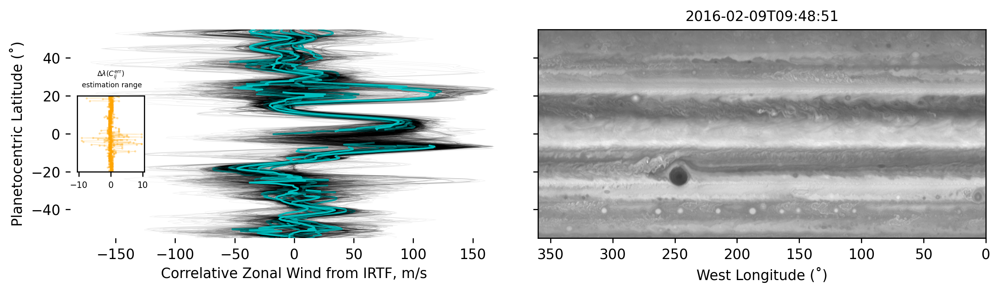

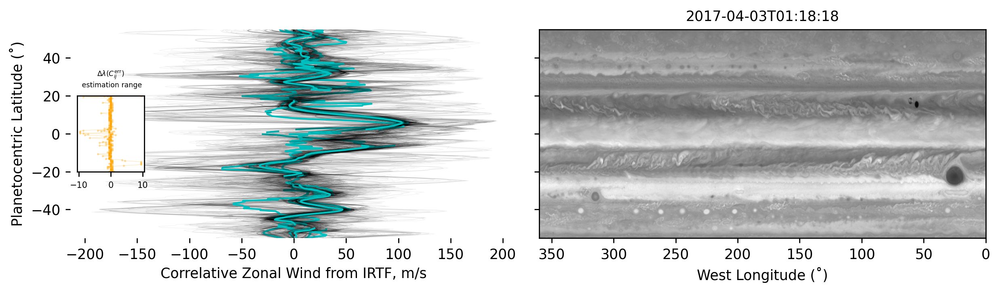

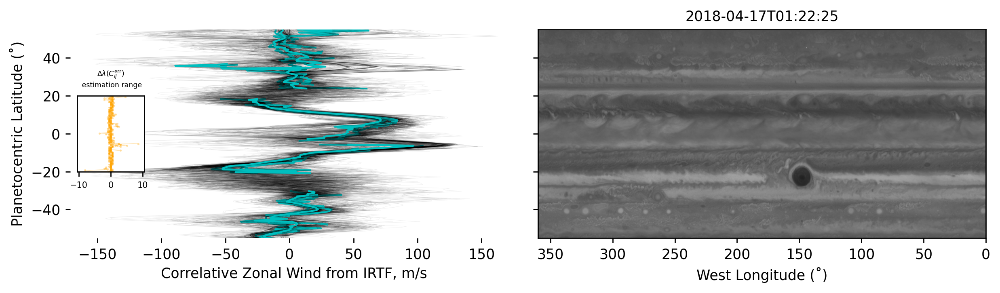

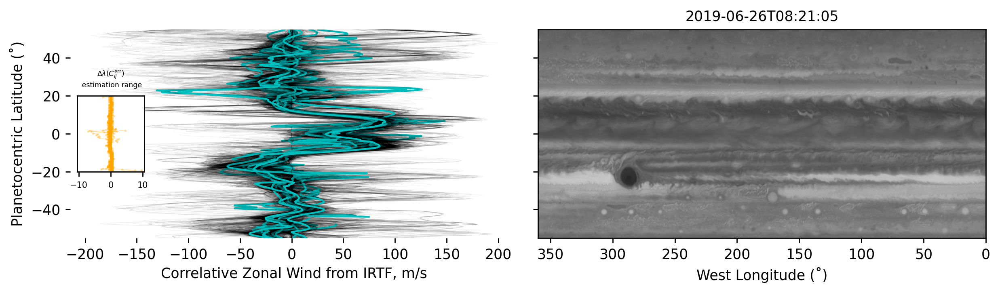

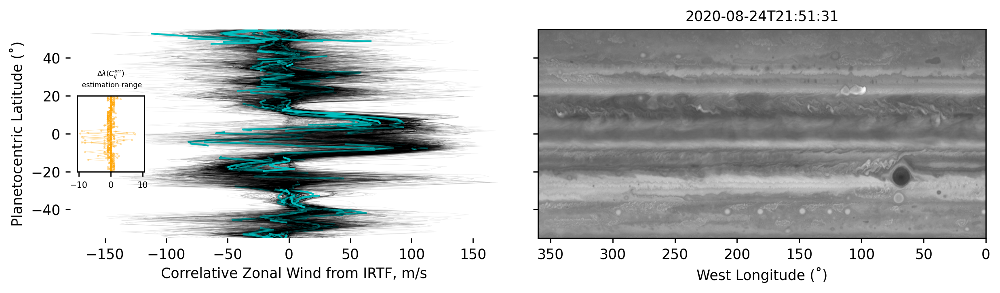

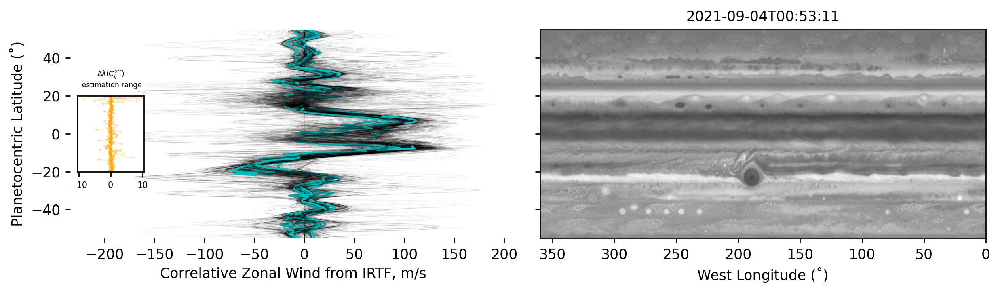

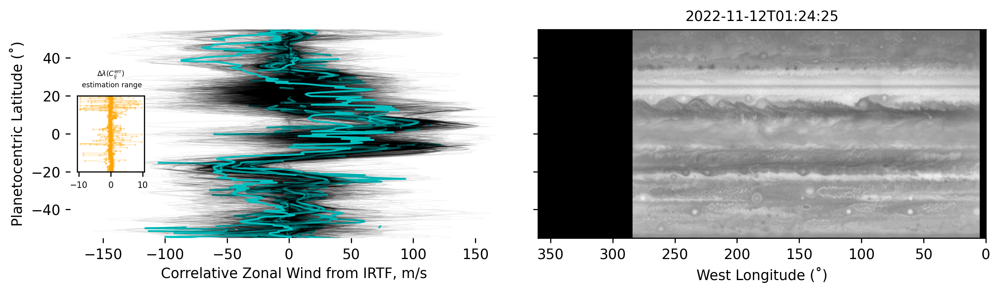

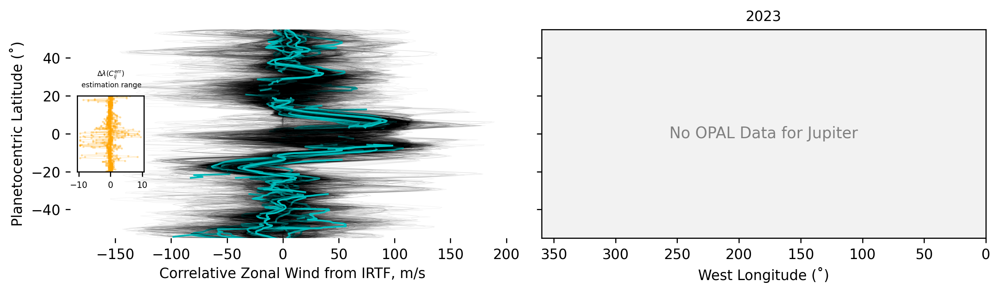

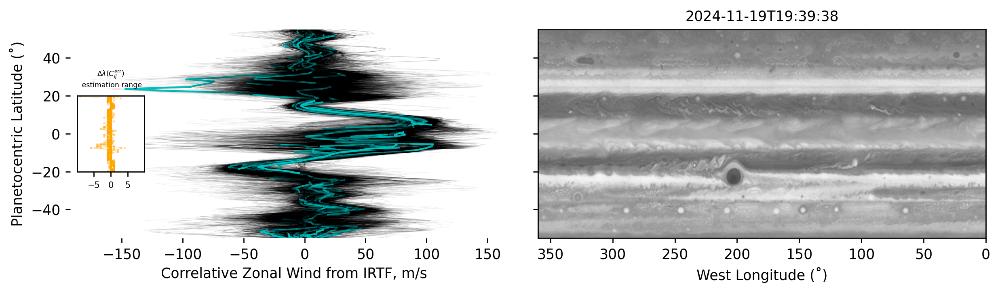

In [49]:
%matplotlib inline

crit_lat = 55
hst_years = [2016,2017,2018,2019,2020,2021,2022,2024]

for i_f, f in enumerate(year_arr):
    plt.figure(figsize=(10, 3), dpi=250)
    ax_left = plt.subplot(121)
    ax_inset = inset_axes(ax_left, width="15%", height="36.4%", loc="center left", borderpad=0.5)
    for j in range(len(IR_dataframe[i_f]["corr1D_list"])):
        if 2.0 < IR_dataframe[i_f]["regional_wind_err_bound_list"][j][0] <= 10.0:
            if (i_f, j) not in skip:
                rough_wind_full = np.zeros_like(IR_dataframe[i_f]['corr_slide_list'][j][0])
                smooth_wind_full = np.zeros_like(IR_dataframe[i_f]['corr_slide_list'][j][0])
                print(IR_dataframe[i_f]['corr_slide_list'][j][0].shape[1])
                for c in range(IR_dataframe[i_f]['corr_slide_list'][j][0].shape[1]):
                    rough_wind_full[:, c] = -ZWP_Class.getSpeedatLat(IR_dataframe[i_f]['corr_slide_list'][j][0][:, c], IR_dataframe[i_f]['lat_array_used'][j][0], IR_dataframe[i_f]["delta_t_list"][j][0])
                    smooth_wind_full[:, c] = ZWP_Class.getSmoothedProfile(rough_wind_full[:, c], IR_dataframe[i_f]['lat_array_used'][j][0], jet_width=7, poly_order=3)
                    ax_left.plot(smooth_wind_full[:, c], IR_dataframe[i_f]['lat_array_used'][j][0], color='k', lw=0.3, alpha=0.05)
                weighted_wind = ZWP_Class.customWeightedAvg(smooth_wind_full[IR_dataframe[i_f]['lat_delta_indices_list'][j][0][0]:IR_dataframe[i_f]['lat_delta_indices_list'][j][0][1], :], IR_dataframe[i_f]['stagger_bool_list'][j][0, 0, ...])
                ax_left.plot(weighted_wind, IR_dataframe[i_f]['lat_array_used'][j][0][IR_dataframe[i_f]['lat_delta_indices_list'][j][0][0]:IR_dataframe[i_f]['lat_delta_indices_list'][j][0][1]], color='c', lw=1.25)
                ax_left.set_frame_on(False)
                ax_left.set_ylim(-crit_lat, crit_lat)

                # IR_dataframe[i_f]["region_std_list"][j][0]
                ax_inset.plot(
                IR_dataframe[i_f]["corr1D_err_list"][j][0],
                IR_dataframe[i_f]['lat_array_used'][j][0],
                marker='o', ms=0.5, color='orange', lw=0.25, alpha=0.35
                )
                ax_inset.set_ylim(-20, 20)
                # ax_inset.set_xticks([])
                ax_inset.tick_params(axis='x', labelsize=6) 
                ax_inset.set_yticks([])
                ax_inset.set_title(r'$\Delta \lambda(C^{\rm err}_{ij})$'+'\n estimation range', fontsize=5)

    ax_left.set_ylabel('Planetocentric Latitude (˚)', fontsize=10), ax_left.set_xlabel('Correlative Zonal Wind from IRTF, m/s', fontsize=10)

    ax_right = plt.subplot(122)
    if f in hst_years:
        hst_index = hst_years.index(f)
        ax_right.imshow(
            np.flipud(zipped_hst[hst_index][0]),
            extent=[360, 0, -90, 90],
            cmap='gray',
            aspect='auto',
            origin='lower'
        )
        ax_right.set_title(zipped_hst[hst_index][2], fontsize=10)
    else:
        # Empty framed panel for missing year
        ax_right.set_xlim(360, 0)
        ax_right.set_ylim(-90, 90)
        ax_right.text(
            0.5, 0.5, "No OPAL Data for Jupiter",
            transform=ax_right.transAxes,
            ha='center', va='center',
            fontsize=11, color='gray'
        )
        ax_right.set_title(f"{f}", fontsize=10)
    ax_right.tick_params(labelleft=False)
    ax_right.set_xlabel('West Longitude (˚)', fontsize=10)
    ax_right.set_ylim(-crit_lat, crit_lat)
    ax_right.set_facecolor('0.95')
    ax_right.set_frame_on(True)
    # plt.subplot(122)
    # plt.imshow(np.flipud(sorted_zipped_hst[i_f][0]), extent=[360, 0, -90, 90], cmap='gray', aspect='auto', origin='lower')
    # plt.gca().tick_params(labelleft=False)
    # plt.xlabel('West Longitude', fontsize=10)
    # plt.ylim(-crit_lat, crit_lat)
    # plt.title(sorted_zipped_hst[i_f][1], fontsize=10)
    plt.tight_layout()
plt.show()

In [15]:
img_ind = 10
y_ind = 0
compatible_map_pairs_specific = run_stagger_pipeline(year_str='2016', test_i=img_ind, long_shift_applied=150, margin_app=5, force_shift=False, save_bool=False)

map shape:  (360, 720)

start and stop margins (prior to shifting):  283 689
Shift applied due to map wrapping.

start and stop margins (after possible shift):  398 694
loc:  398 693
possible shifts : 102 window len in pix 90 window step in pix 2 loc 0, -1, and diff.  398 693 295
hm1.shape, hm2.shape (221, 295) (221, 295)
len of lat_array:  360
final in_func_counter:  103

start and stop margins (prior to shifting):  283 689
Shift applied due to map wrapping.

start and stop margins (after possible shift):  398 694
Entered sub function
['/prvt/cirs12/spex/2016nov1/5.10/jupiter/jcf0022700356.cmap.gz', '/prvt/cirs12/spex/2016nov2/5.10/jupiter/jcf0003700060.cmap.gz']
/Users/ahyder/Desktop/windfieldproject/spex/outputs/outputs_with_stagger/2016/ 2016nov1_jcf0022700356_jcf0003700060
['jcf0022700356.cmap.gz', 'jcf0003700060.cmap.gz']
['2016-11-01T20:53:38.92188', '2016-11-02T17:10:07.61719']
Mean and std of ∆x_pixels at the sub-pixel level post sigma clipping:  -0.125 0.7644442425710327
Actu

In [37]:
year_and_index_pairing = {'2016' : [1,2,3,4,5,6],
                          '2017' : [6,7,8],
                          '2018' : [0,1,2,4],
                          '2019' : [7,8,9,10,11],
                          '2020' : [6,9],
                          '2021' : [10,11,12],
                          '2022' : [6,7,10,11],
                          '2023' : [0,1,2,6,7,9,16],
                          '2024' : [3,6,8,9,10,11]}

# year_and_index_full_pairing = {'2016' : [9,10],
#                                '2017' : [6,7,8,10],
#                                '2018' : [0,1,2], #
#                                '2019' : [4,5,6,7,8,9,10,11,12,13,16], #
#                                '2020' : [8,9], #
#                                '2021' : [10,11,14,15], #
#                                '2022' : [2,4,5,6,7,9,10,11,12], #
#                                '2023' : [0,1,2,3,6,7,9,10,16], #
#                                '2024' : [0,2,3,4,6,7,8,9,10,11,13,14,15,16,19]}

# more conservative:
# year_and_index_full_pairing = {'2016' : [9,10],
#                                '2017' : [6,7,8,10],
#                                '2018' : [1,2], #
#                                '2019' : [6,8,9,10,11,12,13,16], #
#                                '2020' : [8], #
#                                '2021' : [10,14], #
#                                '2022' : [7,9,10,11,12], #
#                                '2023' : [0,1,2,6,7,9,10,16], #
#                                '2024' : [0,2,3,4,6,7,8,9,10,11,13,14,15,16,19]}

# EVEN more conservative:
year_and_index_full_pairing = {'2016' : [10],
                               '2017' : [6,7,10],
                               '2018' : [1,2], #
                               '2019' : [8,9,12,13,16], #
                               '2020' : [8], #
                               '2021' : [10,14], #
                               '2022' : [7,9,11], #
                               '2023' : [1,2,9,10], #
                               '2024' : [0,2,3,7,8,9,19]}
print(year_and_index_pairing.keys())
print(year_and_index_full_pairing.keys())

dict_keys(['2016', '2017', '2018', '2019', '2020', '2021', '2022', '2023', '2024'])
dict_keys(['2016', '2017', '2018', '2019', '2020', '2021', '2022', '2023', '2024'])


In [38]:
print('Indices of image pairs that are used for plotting below... This is the downselected list of correlations; empirically constrained')
for id, i in enumerate(year_arr):
    print(i, '- With stagger: ', year_and_index_pairing[str(i)], '\t Full only: ', year_and_index_full_pairing[str(i)])
    for v in year_and_index_full_pairing[str(i)]:
        print(IR_dataframe[id]['lat_array_used'][v][0].shape)
# print(len(year_and_index_full_pairing['2024']))
print('Default lowest cmap lat res.: ', lat_array.shape)

Indices of image pairs that are used for plotting below... This is the downselected list of correlations; empirically constrained
2016 - With stagger:  [1, 2, 3, 4, 5, 6] 	 Full only:  [10]
(360,)
2017 - With stagger:  [6, 7, 8] 	 Full only:  [6, 7, 10]
(360,)
(360,)
(360,)
2018 - With stagger:  [0, 1, 2, 4] 	 Full only:  [1, 2]
(360,)
(360,)
2019 - With stagger:  [7, 8, 9, 10, 11] 	 Full only:  [8, 9, 12, 13, 16]
(360,)
(360,)
(360,)
(360,)
(360,)
2020 - With stagger:  [6, 9] 	 Full only:  [8]
(180,)
2021 - With stagger:  [10, 11, 12] 	 Full only:  [10, 14]
(360,)
(180,)
2022 - With stagger:  [6, 7, 10, 11] 	 Full only:  [7, 9, 11]
(360,)
(360,)
(360,)
2023 - With stagger:  [0, 1, 2, 6, 7, 9, 16] 	 Full only:  [1, 2, 9, 10]
(360,)
(360,)
(360,)
(360,)
2024 - With stagger:  [3, 6, 8, 9, 10, 11] 	 Full only:  [0, 2, 3, 7, 8, 9, 19]
(180,)
(180,)
(180,)
(180,)
(360,)
(360,)
(360,)
Default lowest cmap lat res.:  (180,)


/var/folders/xh/s9lkw5113q98j632zllsplyr0000gq/T/ipykernel_68996/114936473.py:72: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


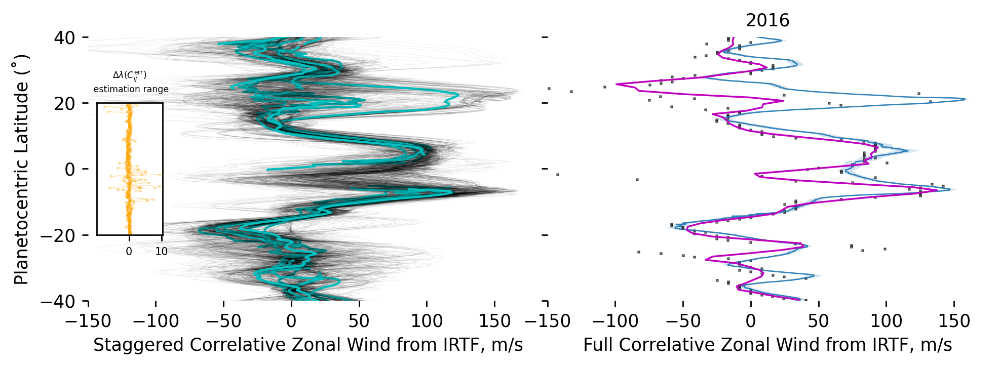

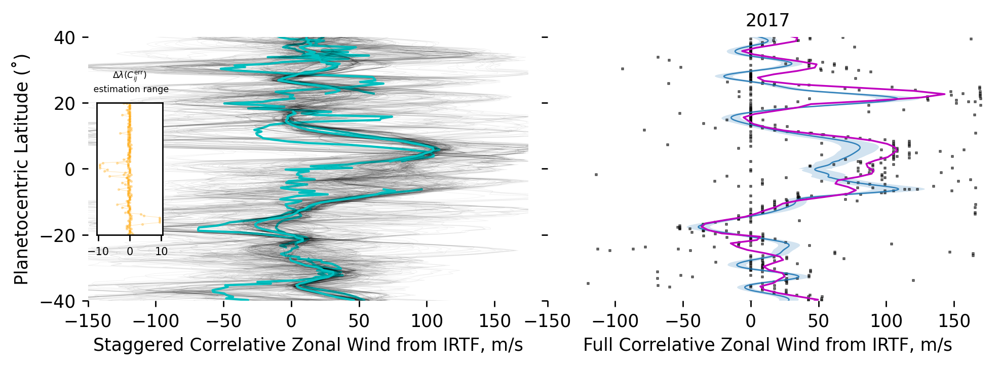

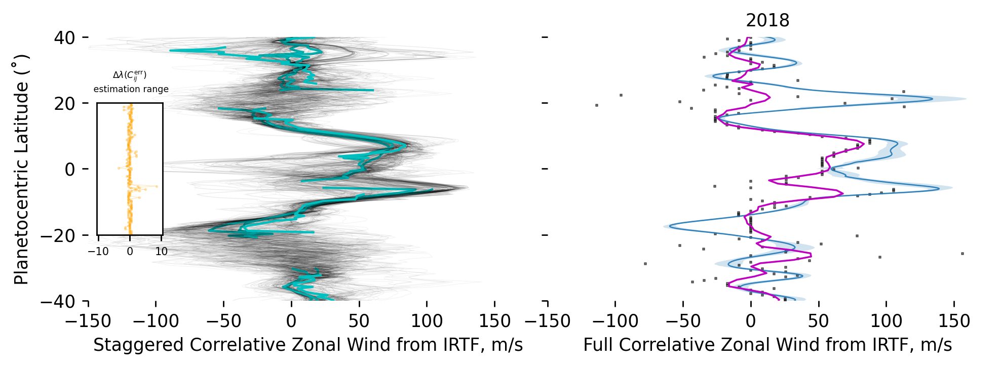

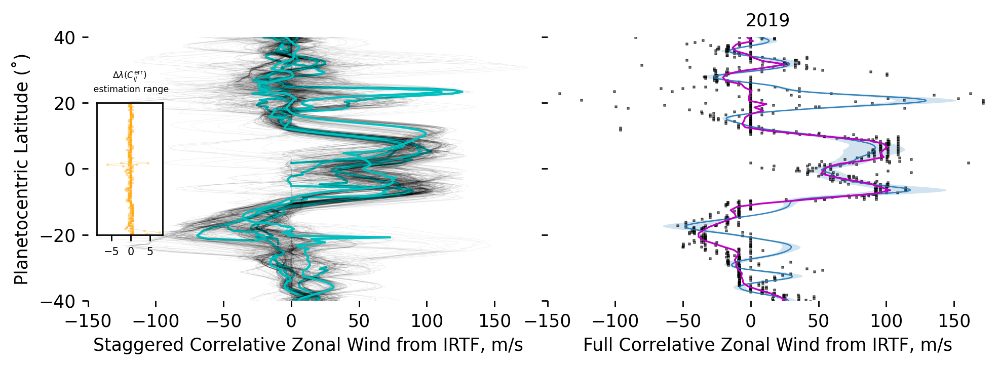

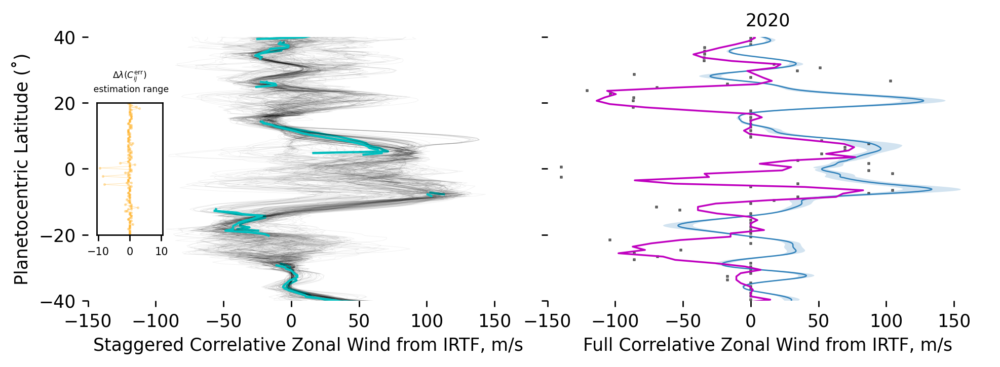

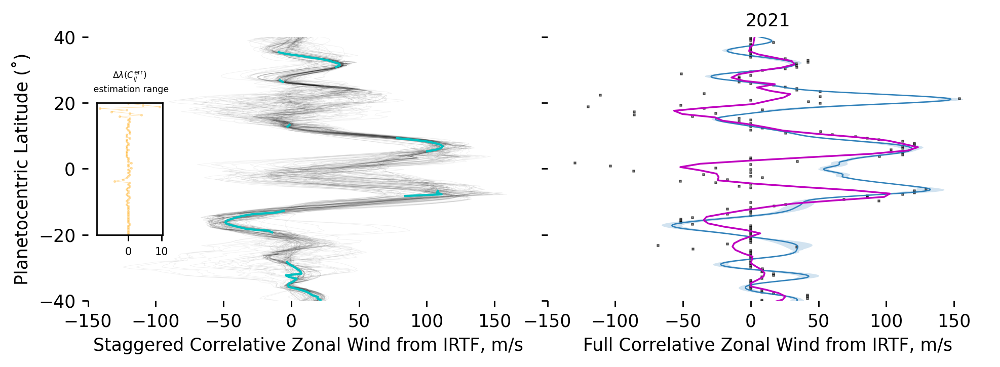

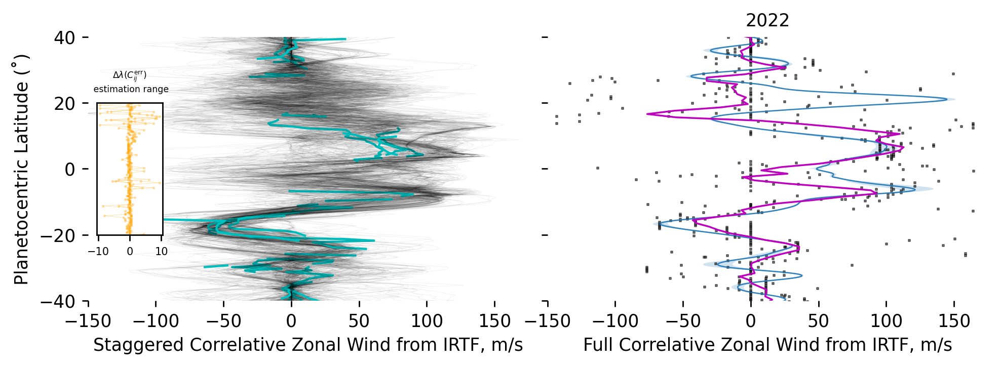

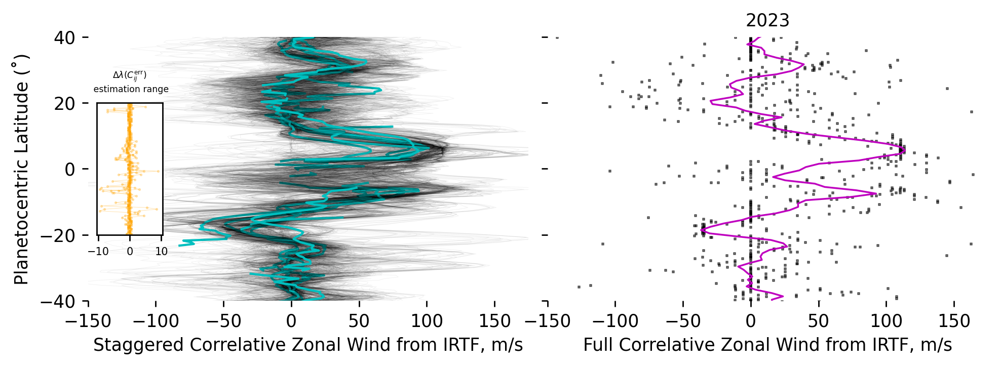

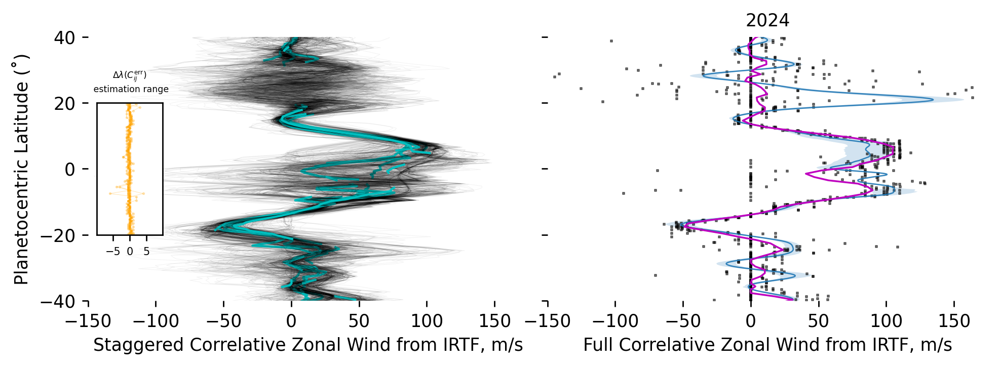

In [52]:
%matplotlib inline

crit_lat = 40

for i_f, f in enumerate(year_arr):
    plt.figure(figsize=(8, 3), dpi=250)
    ax_left = plt.subplot(121)
    ax_inset = inset_axes(ax_left, width="15%", height="50%", loc="center left", borderpad=0.5)
    for j in range(len(IR_dataframe[i_f]["corr1D_list"])):
        if 2.0 < IR_dataframe[i_f]["regional_wind_err_bound_list"][j][0] <= 10.0:
            if j in year_and_index_pairing[str(f)]:
                rough_wind_full = np.zeros_like(IR_dataframe[i_f]['corr_slide_list'][j][0])
                smooth_wind_full = np.zeros_like(IR_dataframe[i_f]['corr_slide_list'][j][0])
                # print(IR_dataframe[i_f]['corr_slide_list'][j][0].shape[1])
                for c in range(IR_dataframe[i_f]['corr_slide_list'][j][0].shape[1]):
                    rough_wind_full[:, c] = -ZWP_Class.getSpeedatLat(IR_dataframe[i_f]['corr_slide_list'][j][0][:, c], IR_dataframe[i_f]['lat_array_used'][j][0], IR_dataframe[i_f]["delta_t_list"][j][0])
                    smooth_wind_full[:, c] = ZWP_Class.getSmoothedProfile(rough_wind_full[:, c], IR_dataframe[i_f]['lat_array_used'][j][0], jet_width=7, poly_order=3)
                    ax_left.plot(smooth_wind_full[:, c], IR_dataframe[i_f]['lat_array_used'][j][0], color='k', lw=0.3, alpha=0.05)
                weighted_wind = ZWP_Class.customWeightedAvg(smooth_wind_full[IR_dataframe[i_f]['lat_delta_indices_list'][j][0][0]:IR_dataframe[i_f]['lat_delta_indices_list'][j][0][1], :], IR_dataframe[i_f]['stagger_bool_list'][j][0, 0, ...])
                ax_left.plot(weighted_wind, IR_dataframe[i_f]['lat_array_used'][j][0][IR_dataframe[i_f]['lat_delta_indices_list'][j][0][0]:IR_dataframe[i_f]['lat_delta_indices_list'][j][0][1]], color='c', lw=1.25)
                ax_left.set_frame_on(False)
                ax_left.set_ylim(-crit_lat, crit_lat)
                ax_left.set_xlim(-150, 175)

                # IR_dataframe[i_f]["region_std_list"][j][0]
                ax_inset.plot(
                IR_dataframe[i_f]["corr1D_err_list"][j][0],
                IR_dataframe[i_f]['lat_array_used'][j][0],
                marker='o', ms=0.5, color='orange', lw=0.25, alpha=0.35
                )
                ax_inset.set_ylim(-20, 20)
                # ax_inset.set_xticks([])
                ax_inset.tick_params(axis='x', labelsize=6) 
                ax_inset.set_yticks([])
                ax_inset.set_title(r'$\Delta \lambda(C^{\rm err}_{ij})$'+'\n estimation range', fontsize=5)

    ax_left.set_ylabel('Planetocentric Latitude (˚)', fontsize=10), ax_left.set_xlabel('Staggered Correlative Zonal Wind from IRTF, m/s', fontsize=10)

    ax_right = plt.subplot(122)
    if f in hst_years:
        hst_index = hst_years.index(f)
        ax_right.fill_betweenx(np.rad2deg(ZWP_Class.planeto_Graphic2Centric(R_J, R_J_p, zipped_hst[hst_index][1]['LAT'])), 
                         zipped_hst[hst_index][1]['FMZW'] - zipped_hst[hst_index][1]['ERROR'], zipped_hst[hst_index][1]['FMZW'] + zipped_hst[hst_index][1]['ERROR'], alpha=0.2) 
        ax_right.plot(zipped_hst[hst_index][1]['FMZW'], np.rad2deg(ZWP_Class.planeto_Graphic2Centric(R_J, R_J_p, zipped_hst[hst_index][1]['LAT'])), 
                lw=0.75, alpha=0.9)

    mean_smooth_no_slide = [] # default res mean profile
    for j in range(len(IR_dataframe[i_f]["corr1D_list"])):
        if 2.0 < IR_dataframe[i_f]["regional_wind_err_bound_list"][j][0] <= 10.0:
            if j in year_and_index_full_pairing[str(f)]:
                rough_no_slide  = -ZWP_Class.getSpeedatLat(IR_dataframe[i_f]["corr1D_list"][j][0], IR_dataframe[i_f]['lat_array_used'][j][0], IR_dataframe[i_f]["delta_t_list"][j][0])
                smooth_no_slide = ZWP_Class.getSmoothedProfile(rough_no_slide, IR_dataframe[i_f]['lat_array_used'][j][0], jet_width=7, poly_order=3)
                mean_smooth_no_slide.append(ZWP_Class.getInterpolatedArray(IR_dataframe[i_f]['lat_array_used'][j][0], smooth_no_slide, lat_array))
                ax_right.scatter(rough_no_slide, IR_dataframe[i_f]['lat_array_used'][j][0], marker='s', s=2, color='k', lw=0.5, alpha=0.5)
                # ax_right.plot(smooth_no_slide, IR_dataframe[i_f]['lat_array_used'][j][0], color='k', lw=0.5, alpha=0.5)
                ax_right.set_frame_on(False)
                ax_right.set_ylim(-crit_lat, crit_lat)
                ax_right.set_xlim(-150, 175)

    # Take an average of the downselected full correlations:
    if len(mean_smooth_no_slide) > 0:
        mean_profile = np.nanmedian(np.vstack(mean_smooth_no_slide), axis=0)
        ax_right.plot(
            mean_profile,
            lat_array,
            color='m', lw=1.0
        )
    ax_right.tick_params(labelleft=False)
    ax_right.set_xlabel('Full Correlative Zonal Wind from IRTF, m/s', fontsize=10)
    ax_right.set_title(f"{f}", fontsize=10)

    plt.tight_layout()
plt.show()

In [41]:
beta, d2udy2, kuo = ZWP_Class.getKuoCriterion(mean_profile, lat_array)

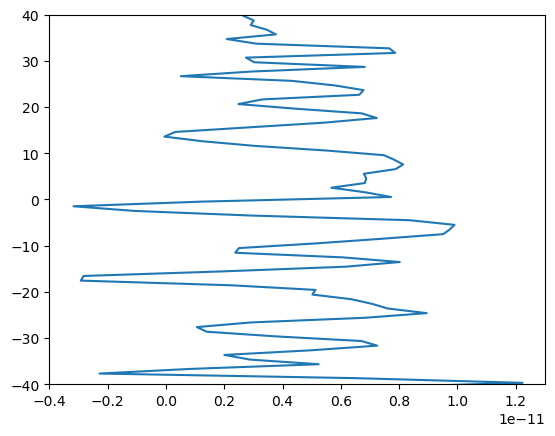

In [42]:
%matplotlib inline
plt.figure()
plt.plot(kuo, lat_array)
# plt.plot(mean_profile, lat_array)
plt.ylim(-40, 40)
plt.show()